In [1]:
from mne import read_epochs, set_eeg_reference, compute_rank
from mne.decoding import CSP, UnsupervisedSpatialFilter
from mne.preprocessing import ICA, EOGRegression
import numpy as np
from mne.viz import plot_ica_components
from jupyterthemes.stylefx import set_nb_theme
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
set_nb_theme('gruvboxd')

Load and Preprocessing

In [2]:
import sys
sys.path.append('../../preprocessing')
from load_data import load_raw_to_epochs, get_channel_types

# load_raw_to_epochs('mo.bdf', True)

In [4]:
raw = read_epochs('raw_epo.fif')

Reading C:\Users\Alberto\Documents\BCI\data\ysf\raw_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7999.02 ms
        0 CTF compensation matrices available
Not setting metadata
103 matching events found
No baseline correction applied
0 projection items activated


Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    7.8s
[Parallel(n_jobs=8)]: Done 396 tasks      | elapsed:    9.3s
[Parallel(n_jobs=8)]: Done 5776 tasks      | elapsed:   18.3s
[Parallel(n_jobs=8)]: Done 7082 tasks      | elapsed:   20.4s
[Parallel(n_jobs=8)]: Done 7416 out of 7416 | elapsed:   20.9s finished


Using matplotlib as 2D backend.


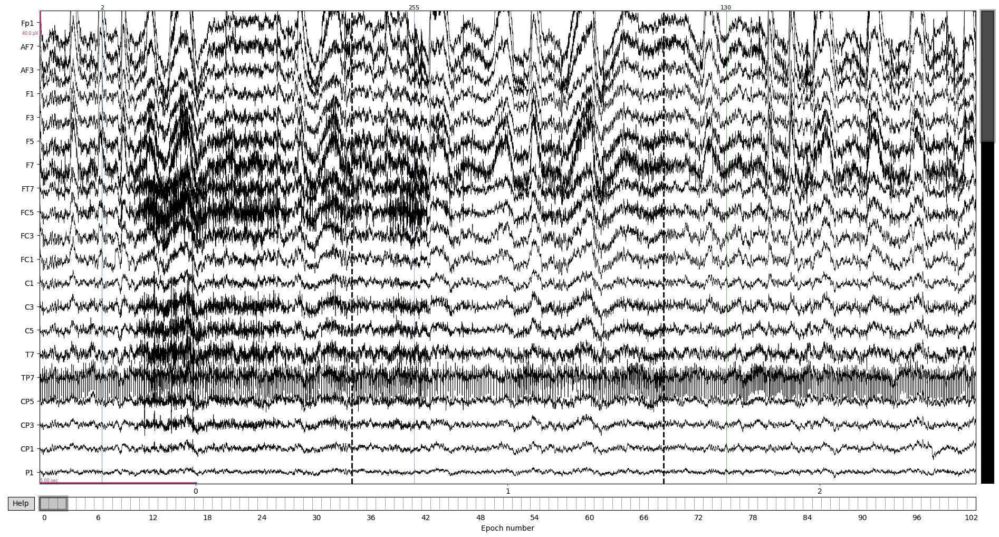

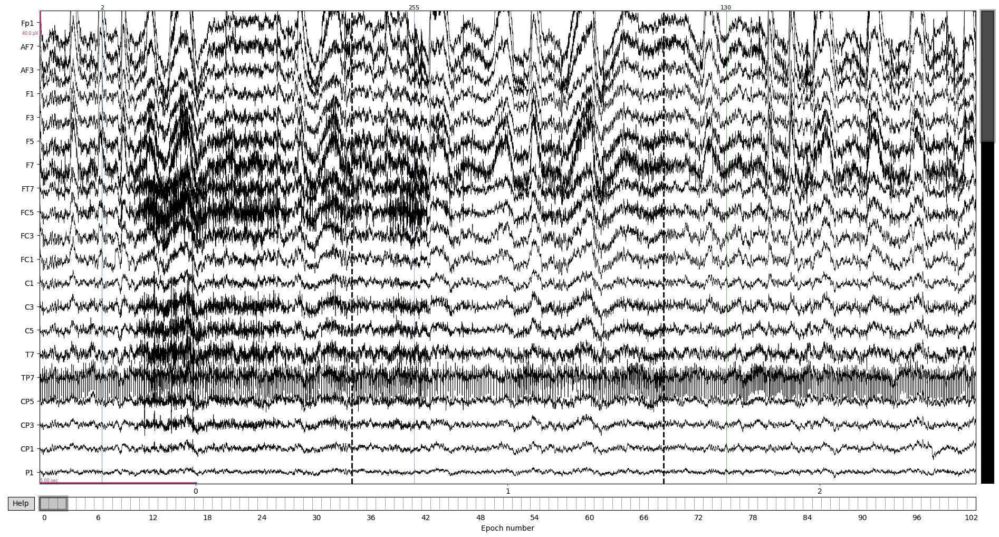

In [4]:
raw.copy().filter(1,120, n_jobs=8).plot(n_channels=20, n_epochs=3, scalings=20e-6, events=raw.events)

In [5]:
raw

Number of events,103
Events,left: 21r_pinch: 20r_stop: 20rest: 23right: 19
Time range,-2.000 – 7.999 sec
Baseline,off


In [14]:
raw.event_id.items()


dict_items([('r_pinch', 2), ('r_stop', 4), ('left', 130), ('right', 134), ('rest', 255)])

In [22]:
events = {v:k for k,v in raw.event_id.items()}
[events[e] for e in raw.events[:,2]]

['r_pinch',
 'rest',
 'left',
 'rest',
 'r_stop',
 'r_stop',
 'r_pinch',
 'r_stop',
 'right',
 'r_pinch',
 'left',
 'rest',
 'right',
 'rest',
 'r_pinch',
 'right',
 'right',
 'r_stop',
 'left',
 'rest',
 'left',
 'r_pinch',
 'r_stop',
 'rest',
 'left',
 'r_pinch',
 'right',
 'rest',
 'left',
 'rest',
 'r_pinch',
 'left',
 'r_stop',
 'rest',
 'left',
 'right',
 'rest',
 'right',
 'right',
 'r_stop',
 'rest',
 'r_pinch',
 'r_stop',
 'right',
 'rest',
 'left',
 'rest',
 'r_pinch',
 'left',
 'rest',
 'r_pinch',
 'r_pinch',
 'r_pinch',
 'r_stop',
 'r_stop',
 'left',
 'left',
 'rest',
 'right',
 'right',
 'rest',
 'r_stop',
 'r_stop',
 'right',
 'rest',
 'r_stop',
 'rest',
 'r_pinch',
 'left',
 'left',
 'r_stop',
 'left',
 'left',
 'rest',
 'r_pinch',
 'rest',
 'right',
 'left',
 'r_stop',
 'r_pinch',
 'right',
 'right',
 'left',
 'rest',
 'r_pinch',
 'rest',
 'r_stop',
 'r_stop',
 'r_stop',
 'r_pinch',
 'r_pinch',
 'rest',
 'left',
 'r_stop',
 'left',
 'left',
 'r_pinch',
 'r_stop',
 'righ

In [21]:
raw.events[:,2]

array([  2, 255, 130, 255,   4,   4,   2,   4, 134,   2, 130, 255, 134,
       255,   2, 134, 134,   4, 130, 255, 130,   2,   4, 255, 130,   2,
       134, 255, 130, 255,   2, 130,   4, 255, 130, 134, 255, 134, 134,
         4, 255,   2,   4, 134, 255, 130, 255,   2, 130, 255,   2,   2,
         2,   4,   4, 130, 130, 255, 134, 134, 255,   4,   4, 134, 255,
         4, 255,   2, 130, 130,   4, 130, 130, 255,   2, 255, 134, 130,
         4,   2, 134, 134, 130, 255,   2, 255,   4,   4,   4,   2,   2,
       255, 130,   4, 130, 130,   2,   4, 134, 134,   2, 134, 134])

Marking bad chanels

In [5]:
bads = ['TP7', 'EXG5', 'EXG7', 'FC6', 'C6', 'T8','FT8', 'F6']
raw.info['bads'] = bads
raw.drop([27, 64, 93])

Dropped 3 epochs: 27, 64, 93


Number of events,100
Events,left: 21r_pinch: 20r_stop: 19rest: 21right: 19
Time range,-2.000 – 7.999 sec
Baseline,off


Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 6768 out of 6768 | elapsed:    8.1s finished


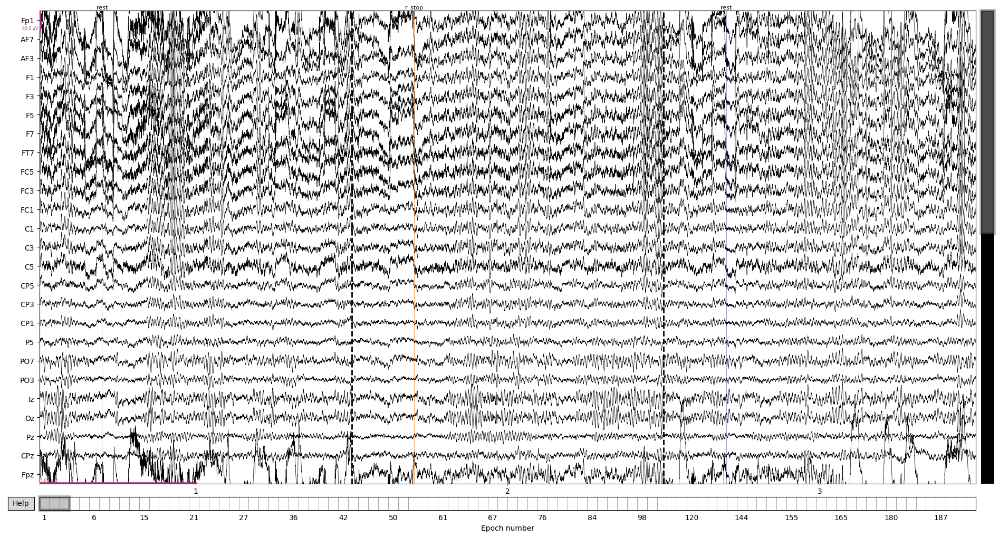

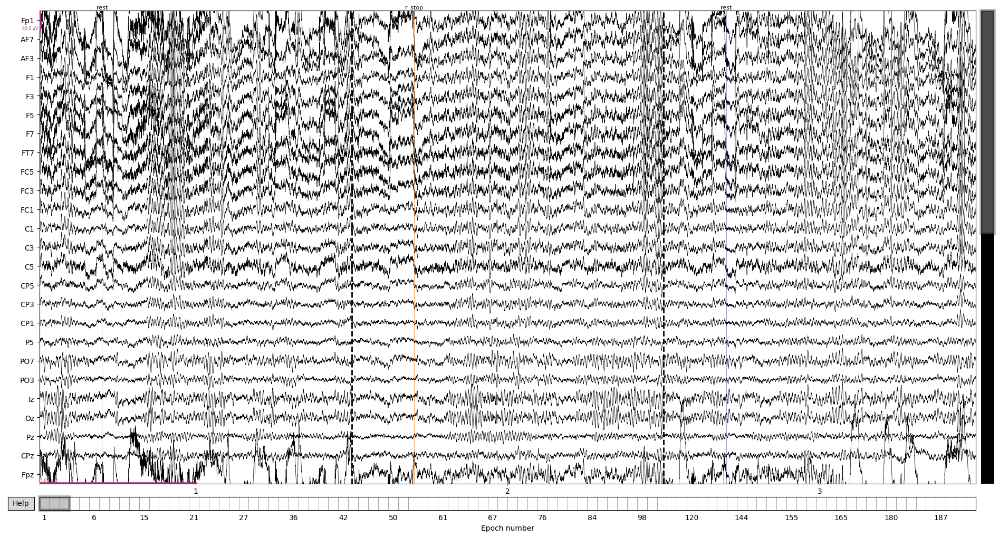

In [20]:
raw.copy().filter(1,120).plot(
    n_channels=25, 
    n_epochs=3, 
    scalings=20e-6, 
    events=raw.events, event_id=raw.event_id)

Referencing

In [6]:
referenced = set_eeg_reference(raw, ref_channels='average')[0]
del raw
# del test
# del dropped

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


Set channel types

In [7]:
referenced.set_channel_types(get_channel_types())

Number of events,100
Events,left: 21r_pinch: 20r_stop: 19rest: 21right: 19
Time range,-2.000 – 7.999 sec
Baseline,off


Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    3.6s
[Parallel(n_jobs=8)]: Done 520 tasks      | elapsed:    4.3s
[Parallel(n_jobs=8)]: Done 3400 tasks      | elapsed:    6.9s
[Parallel(n_jobs=8)]: Done 6272 tasks      | elapsed:    9.5s
[Parallel(n_jobs=8)]: Done 6400 out of 6400 | elapsed:    9.6s finished


Using matplotlib as 2D backend.


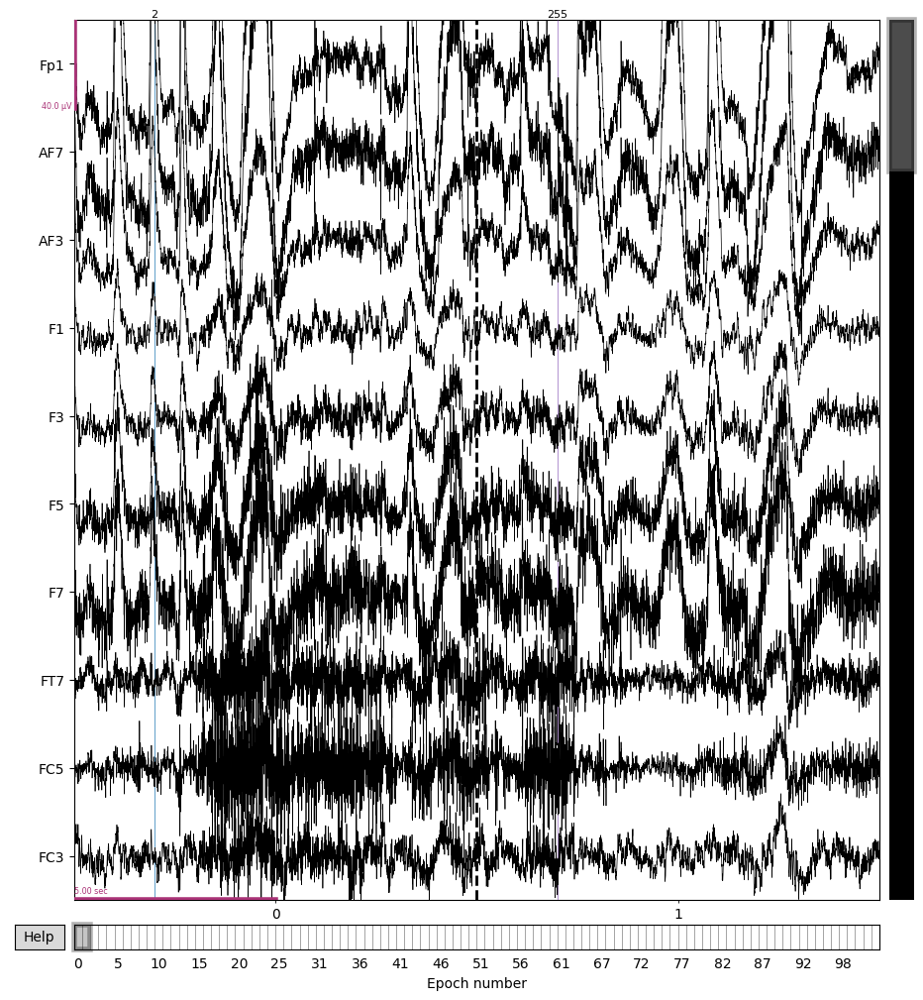

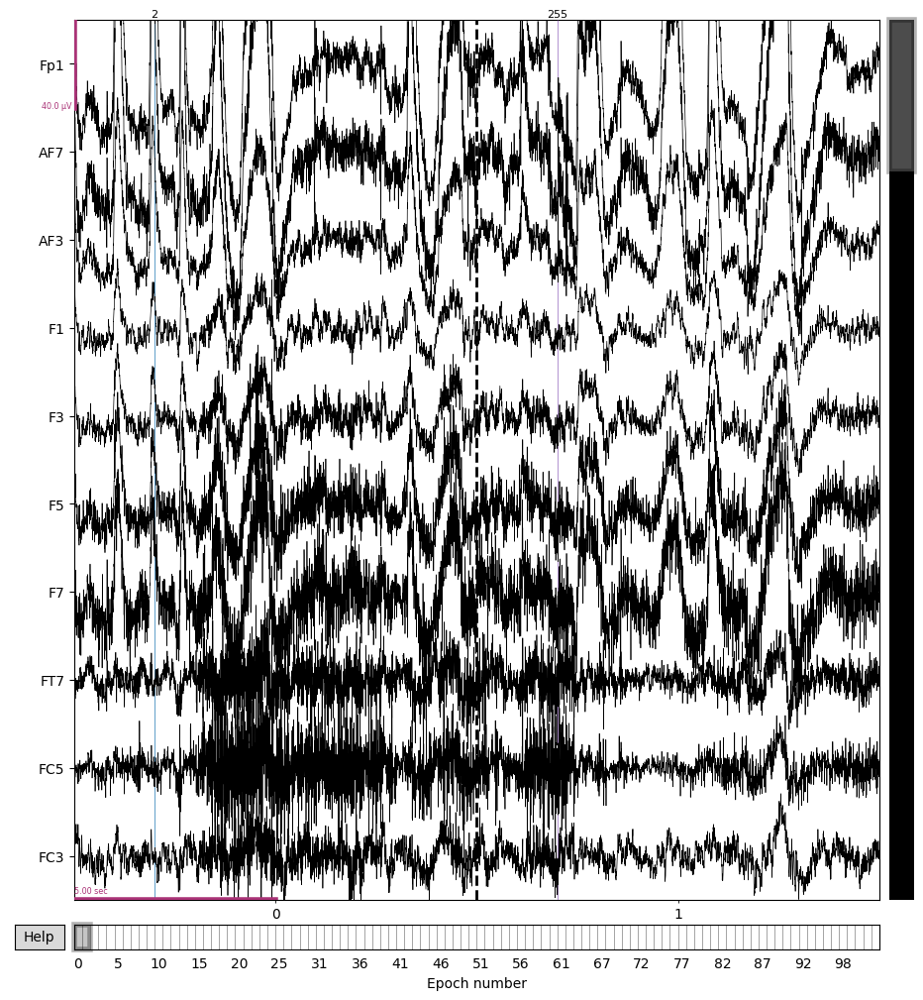

In [9]:
referenced.copy().filter(1,120, n_jobs=8).plot(n_channels=10, n_epochs=2, scalings=20e-6, events=referenced.events, picks=['eeg','ecg'])

EOG Regression


No projector specified for this dataset. Please consider the method self.add_proj.


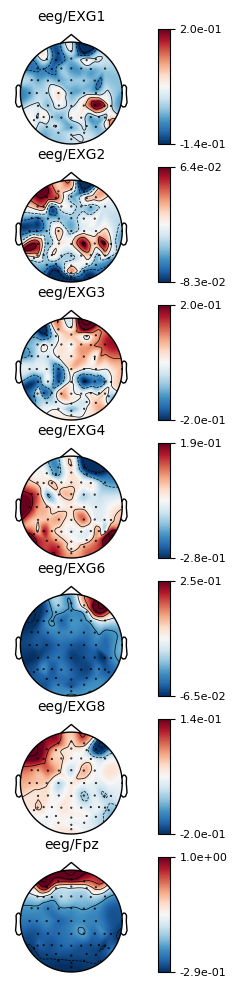

In [8]:
print()
emg_eog = ['EXG1','EXG2','EXG3','EXG4','EXG6','EXG8','Fpz']
regressor = EOGRegression(
    picks='eeg', picks_artifact=emg_eog).fit(referenced)
regressor.plot()
# referenced = regressor.apply(referenced)
referenced.info['bads'] += ['Fpz']

In [9]:
referenced.save('referenced_epo.fif', overwrite=True)
del referenced

Overwriting existing file.


REMOVE ARTIFACTS


In [10]:
epochs = read_epochs('referenced_epo.fif')


Reading C:\Users\Alberto\Documents\BCI\data\ysf\referenced_epo.fif ...
    Found the data of interest:
        t =   -2000.00 ...    7999.02 ms
        0 CTF compensation matrices available
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated



NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


C:\Users\Alberto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


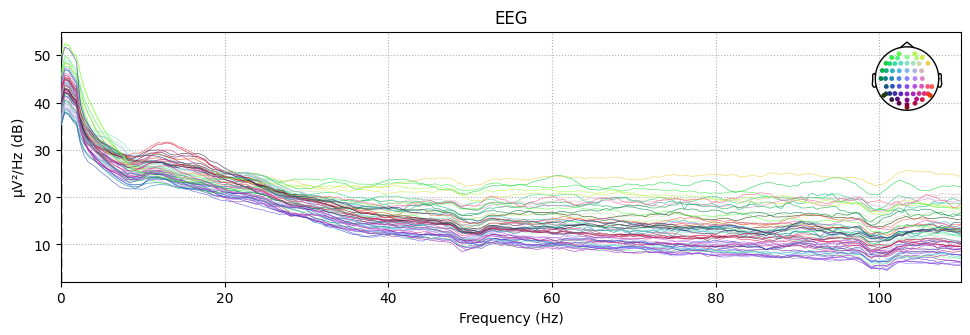

In [13]:
print()
epochs['right','left'].copy().crop(-1,2).plot_psd(fmax=110, tmin=-.1, tmax=2)

ICA

In [11]:
filtered = epochs.copy().filter(1,250, n_jobs=8)
filtered.apply_baseline((-1.4,-0.1))
filtered.crop(0,5)
ica = ICA(n_components=.9, method='picard')
ica.fit(filtered)

Setting up band-pass filter from 1 - 2.5e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 250.00 Hz
- Upper transition bandwidth: 62.50 Hz (-6 dB cutoff frequency: 281.25 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:   12.8s
[Parallel(n_jobs=8)]: Done 334 tasks      | elapsed:   14.0s
[Parallel(n_jobs=8)]: Done 3152 tasks      | elapsed:   19.3s
[Parallel(n_jobs=8)]: Done 6198 tasks      | elapsed:   23.2s
[Parallel(n_jobs=8)]: Done 6400 out of 6400 | elapsed:   23.4s finished


Applying baseline correction (mode: mean)
Fitting ICA to data using 57 channels (please be patient, this may take a while)


C:\Users\Alberto\AppData\Local\Temp\ipykernel_16256\3273349700.py:5: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica.fit(filtered)


Selecting by explained variance: 6 components
Fitting ICA took 22.4s.


Method,picard
Fit,32 iterations on epochs (512100 samples)
ICA components,6
Available PCA components,57
Channel types,eeg
ICA components marked for exclusion,—


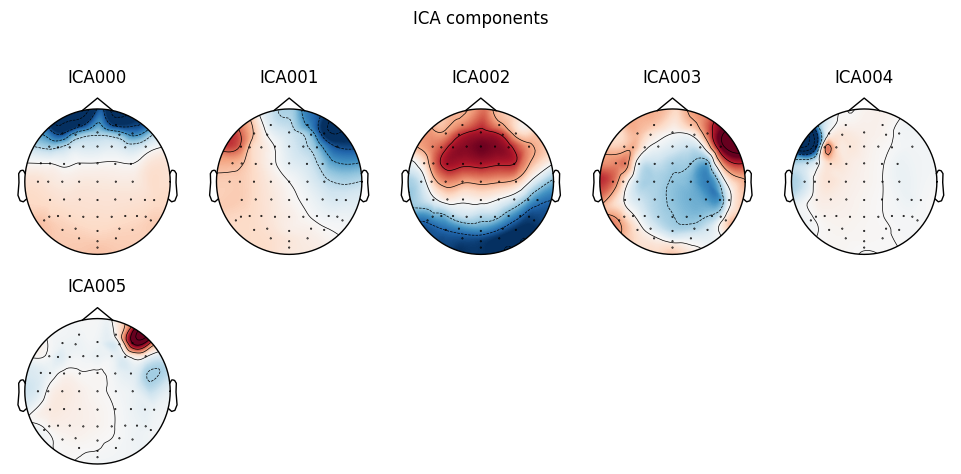

[<MNEFigure size 975x496 with 6 Axes>]

In [12]:
print()
plot_ica_components(ica)


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


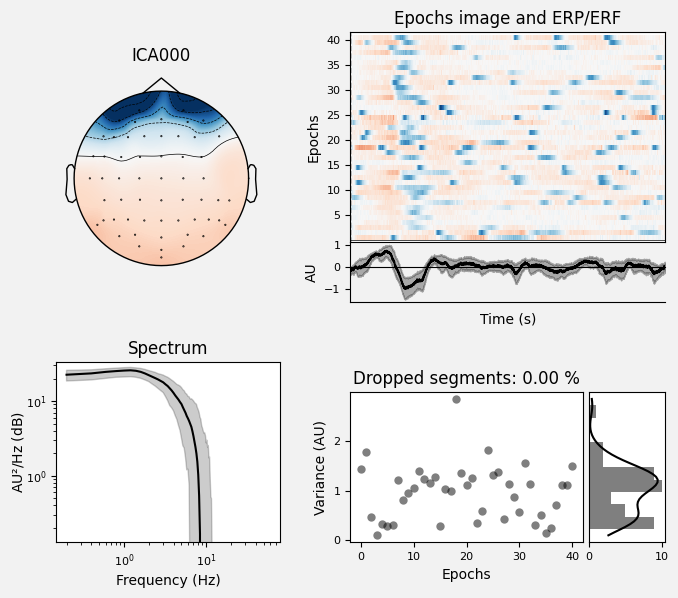

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


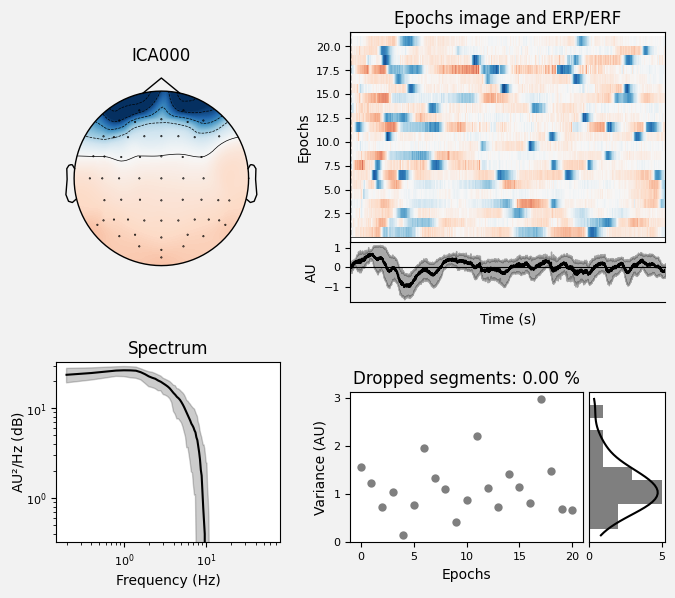

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


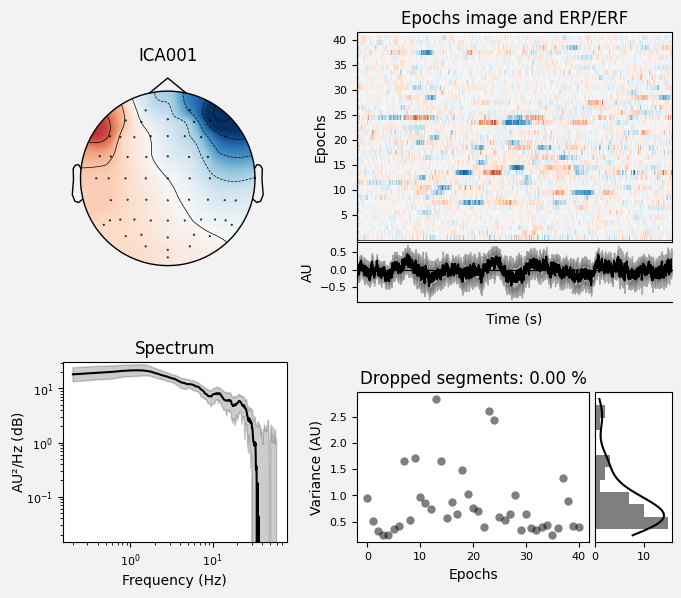

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


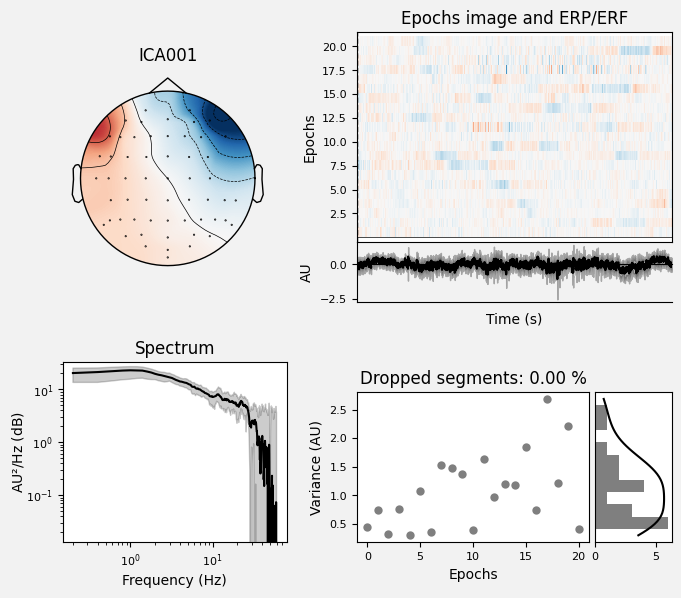

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


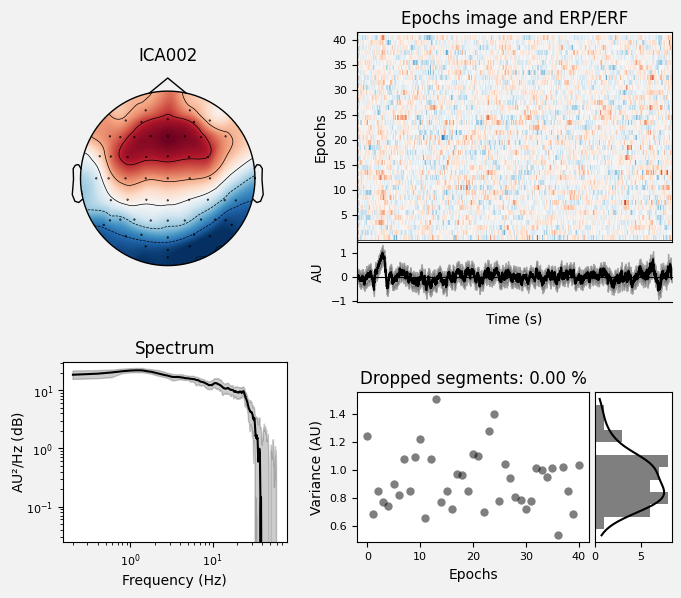

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


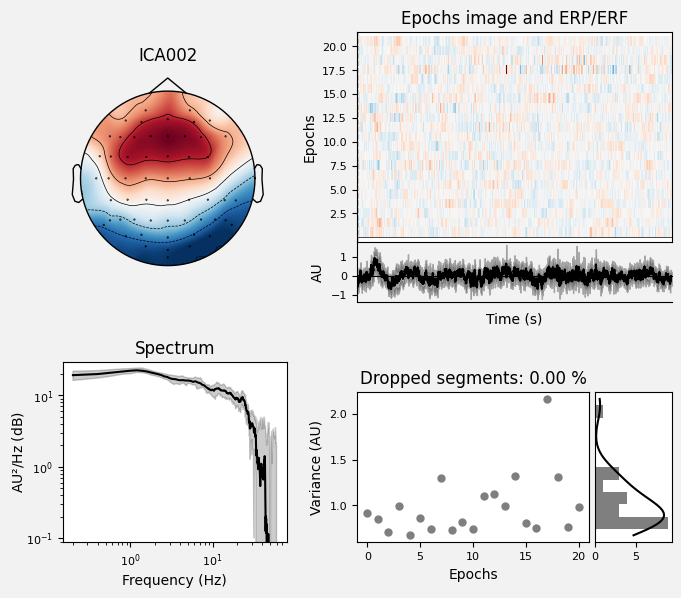

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


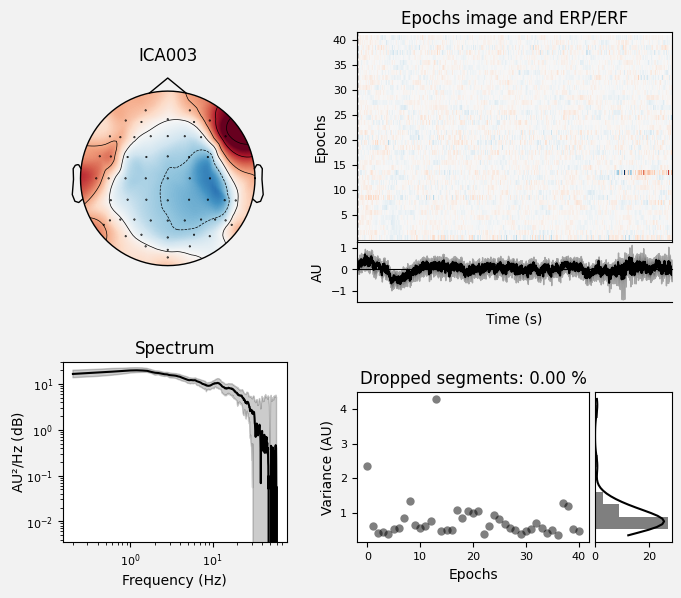

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


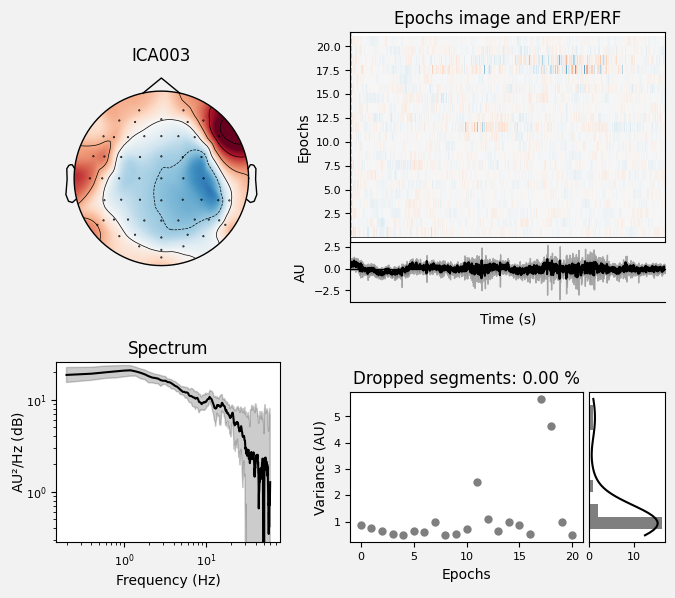

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


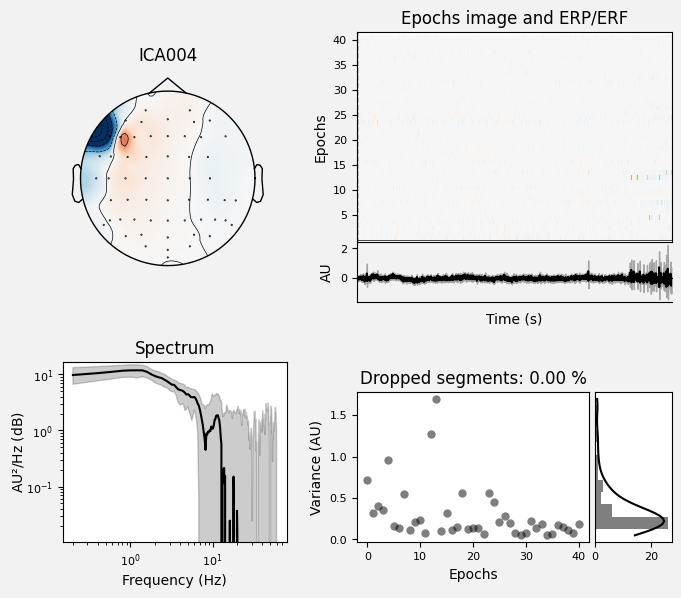

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


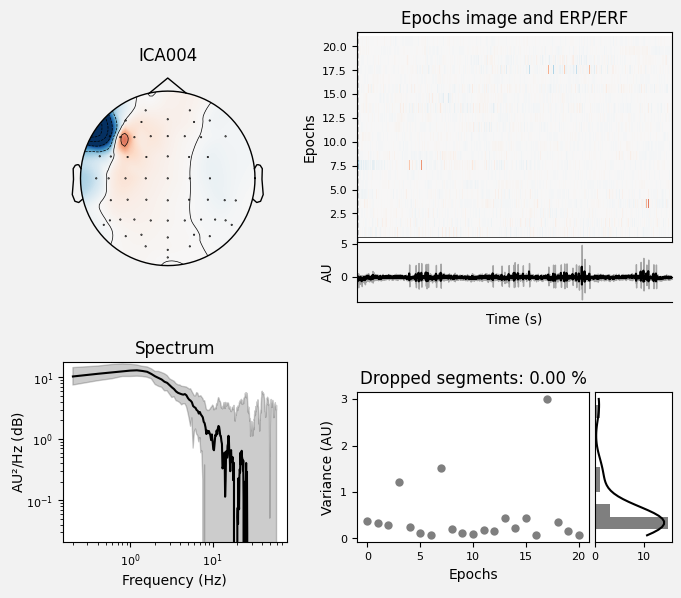

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


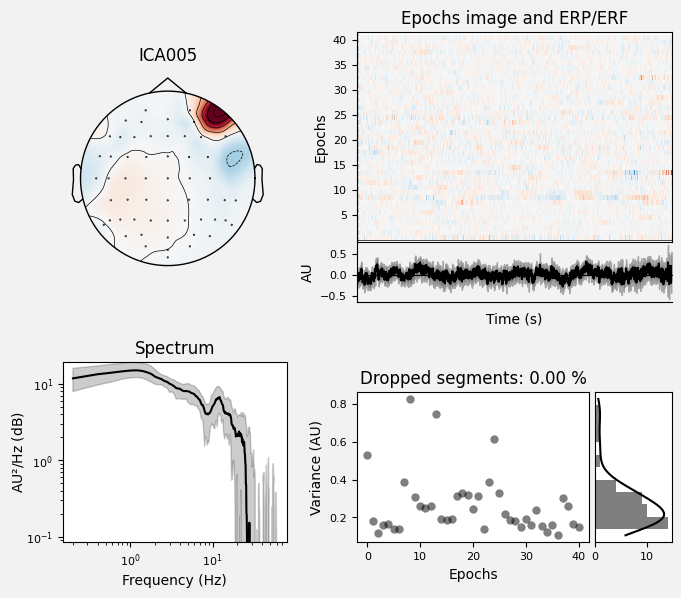

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


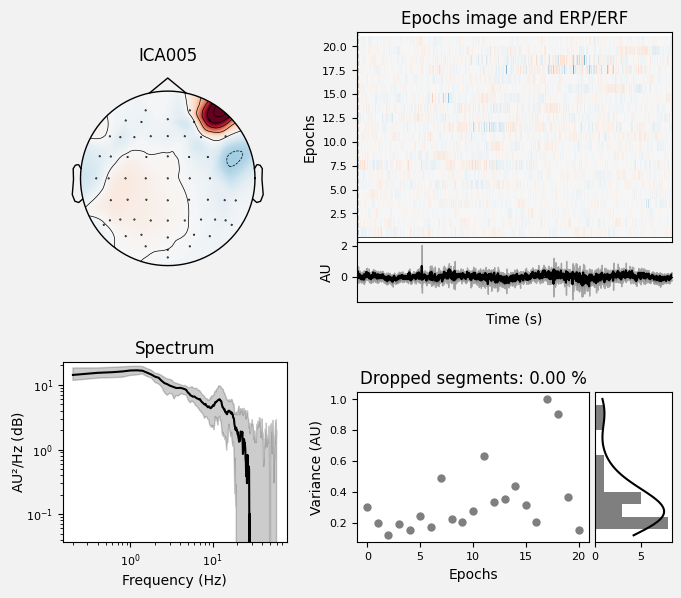

In [13]:
for i in np.arange(6):
    ica.plot_properties(
        epochs['left','r_pinch'].copy().crop(0,5).filter(1,240, verbose=False), 
        picks = [i], 
        log_scale = True,
        psd_args = dict(fmin=.1, fmax=60))

    ica.plot_properties(
        epochs['rest'].copy().crop(0,5).filter(1,240, verbose=False), 
        picks = [i], 
        log_scale = True,
        psd_args = dict(fmin=.1, fmax=60))

In [14]:
ica.apply(epochs, exclude=[0,1,2,3,4,5])

Applying ICA to Epochs instance
    Transforming to ICA space (6 components)
    Zeroing out 6 ICA components
    Projecting back using 57 PCA components


Number of events,100
Events,left: 21r_pinch: 20r_stop: 19rest: 21right: 19
Time range,-2.000 – 7.999 sec
Baseline,off


ERP

Applying baseline correction (mode: mean)
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3381 samples (3.302 sec)



C:\Users\Alberto\AppData\Local\Temp\ipykernel_16256\1473548434.py:1: RuntimeWarning: filter_length (3381) is longer than the signal (1435), distortion is likely. Reduce filter length or filter a longer signal.
  epochs['rest'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1344 out of 1344 | elapsed:    1.0s finished


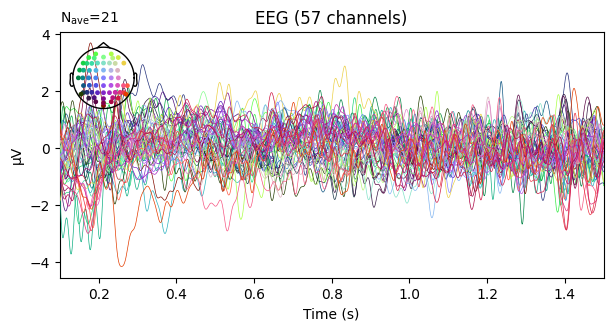

Applying baseline correction (mode: mean)
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3381 samples (3.302 sec)



C:\Users\Alberto\AppData\Local\Temp\ipykernel_16256\1473548434.py:2: RuntimeWarning: filter_length (3381) is longer than the signal (1435), distortion is likely. Reduce filter length or filter a longer signal.
  epochs['right','left'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 2560 out of 2560 | elapsed:    2.4s finished


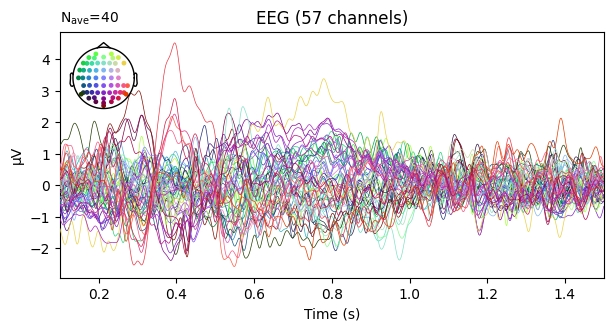

Applying baseline correction (mode: mean)
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3381 samples (3.302 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 2496 out of 2496 | elapsed:    3.0s finished


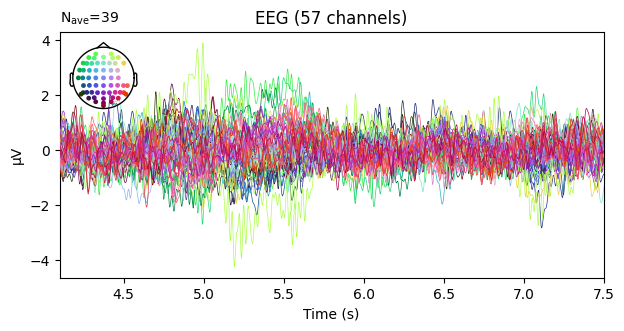

In [15]:
epochs['rest'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
epochs['right','left'].copy().apply_baseline((-1.4, -1)).crop(.1,1.5).filter(1, 40).average().plot()
epochs['r_pinch','r_stop'].copy().apply_baseline((-1.4, -1)).crop(4.1,7.5).filter(1, 40).average().plot()
print()

Setting up band-pass filter from 1 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 3381 samples (3.302 sec)



C:\Users\Alberto\AppData\Local\Temp\ipykernel_8712\2447180343.py:1: RuntimeWarning: filter_length (3381) is longer than the signal (2561), distortion is likely. Reduce filter length or filter a longer signal.
  epochs['rest'].copy().crop(-0.5,2).filter(1,120, n_jobs=8).average().plot()
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 928 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 1344 out of 1344 | elapsed:    0.5s finished


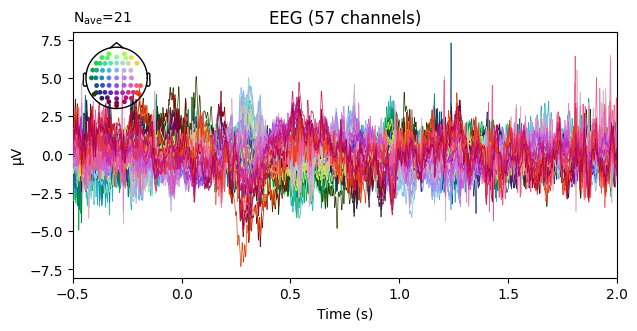

In [22]:
epochs['rest'].copy().crop(-0.5,2).filter(1,120, n_jobs=8).average().plot()
print()

CSP 

In [16]:
le = LabelEncoder()
subset = epochs['left','rest'].copy()
subset.apply_baseline((-1.,-0.1))
subset.drop_channels(epochs.info['bads'])
subset = subset.pick(['eeg'])
y = le.fit_transform(subset.events[:,2])

Applying baseline correction (mode: mean)


In [17]:
pca = UnsupervisedSpatialFilter(PCA(len(subset.info['chs'])), average=False)
csp = CSP(n_components=2, reg=None, log=True, norm_trace=False, rank='info')
x = pca.fit_transform(subset.copy().crop(-0.1,2).filter(5, 20, n_jobs=4, verbose=False).get_data(),y)

Computing rank from data with rank='info'
    MAG: rank 57 after 0 projectors applied to 57 channels
Reducing data rank from 57 -> 57
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='info'
    MAG: rank 57 after 0 projectors applied to 57 channels
Reducing data rank from 57 -> 57
Estimating covariance using EMPIRICAL
Done.


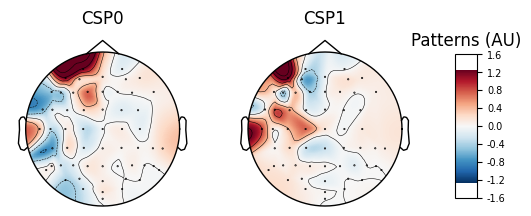

In [18]:
x = pca.fit_transform(subset.copy().crop(-0.1,2).filter(5, 20, n_jobs=4, verbose=False).get_data(),y)
csp.fit(x,y)
csp.plot_patterns(subset.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
print()

Computing rank from data with rank='info'
    MAG: rank 57 after 0 projectors applied to 57 channels
Reducing data rank from 57 -> 57
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='info'
    MAG: rank 57 after 0 projectors applied to 57 channels
Reducing data rank from 57 -> 57
Estimating covariance using EMPIRICAL
Done.


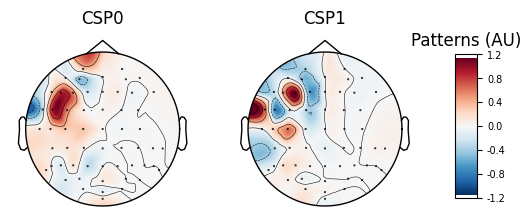

In [19]:
x = pca.fit_transform(subset.copy().crop(-0.1,2).filter(20, 35, n_jobs=4, verbose=False).get_data(),y)
csp.fit(x,y)
csp.plot_patterns(subset.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
print()

Computing rank from data with rank='info'
    MAG: rank 57 after 0 projectors applied to 57 channels
Reducing data rank from 57 -> 57
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='info'
    MAG: rank 57 after 0 projectors applied to 57 channels
Reducing data rank from 57 -> 57
Estimating covariance using EMPIRICAL
Done.


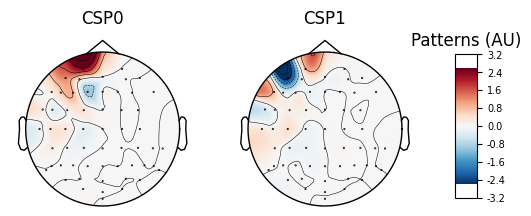

In [20]:
x = pca.fit_transform(subset.copy().crop(-0.1,1.8).filter(70, 90, n_jobs=4, verbose=False).get_data(),y)
csp.fit(x,y)
csp.plot_patterns(subset.info, ch_type='eeg', units='Patterns (AU)', size=1.5)
print()

In [21]:
epochs.save('ica_epo.fif', overwrite=True)

Overwriting existing file.
